In [2]:
#Importing Libraries

In [3]:
import numpy as np
import pickle as pkl
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPool2D

from sklearn.neighbors import NearestNeighbors
import os
from numpy.linalg import norm

In [45]:
#Extract Filenames from Folder

In [13]:
filenames = []
for file in os.listdir('images'):
    filenames.append(os.path.join('images',file))
    

In [14]:
len(filenames)

44441

In [48]:
#Importing ResNet50 Model and Cofiguration

In [15]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalMaxPooling2D, Input
# Define the input shape
input_tensor = Input(shape=(224, 224, 3))

# Load the ResNet50 model without the top layers
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze the base model
base_model.trainable = False

# Apply GlobalMaxPooling2D
x = base_model.output
x = GlobalMaxPooling2D()(x)

# Create the final model
model = tf.keras.models.Model(inputs=base_model.input, outputs=x)

# Print the model summary
model.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 19s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [50]:
#Extracting Fetaures from Image

In [13]:
img = image.load_img('16871.jpg', target_size=(224,224))
img_array = image.img_to_array(img)
img_expand_dim = np.expand_dims(img_array, axis=0)
img_preprocess = preprocess_input(img_expand_dim)
result = model.predict(img_preprocess).flatten()
norm_result = result/norm(result)
norm_result

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


array([0.        , 0.00295298, 0.        , ..., 0.00752506, 0.02113523,
       0.00401739], dtype=float32)

In [16]:
def extract_features_from_images(image_path, model):
    img = image.load_img(image_path, target_size=(224,224))
    img_array = image.img_to_array(img)
    img_expand_dim = np.expand_dims(img_array, axis=0)
    img_preprocess = preprocess_input(img_expand_dim)
    result = model.predict(img_preprocess).flatten()
    norm_result = result/norm(result)
    return norm_result

In [17]:
extract_features_from_images(filenames[0], model)

c:\Users\isha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor']. Received: the structure of inputs=*
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


array([0.        , 0.01761619, 0.00171607, ..., 0.01247238, 0.027264  ,
       0.06899219], dtype=float32)

In [18]:
image_features1 = []
for file in filenames[0:5000]:
    image_features1.append(extract_features_from_images(file, model))
image_features1

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━

[array([0.        , 0.01761619, 0.00171607, ..., 0.01247238, 0.027264  ,
        0.06899219], dtype=float32),
 array([0.        , 0.03648943, 0.        , ..., 0.00997913, 0.02375534,
        0.04649905], dtype=float32),
 array([0.        , 0.03642146, 0.00710437, ..., 0.00140771, 0.        ,
        0.05435037], dtype=float32),
 array([0.00232166, 0.0503055 , 0.00747742, ..., 0.00346686, 0.03391019,
        0.04565743], dtype=float32),
 array([0.00306835, 0.06240452, 0.        , ..., 0.00170624, 0.02032885,
        0.05833261], dtype=float32),
 array([0.        , 0.10469119, 0.00198091, ..., 0.        , 0.03033769,
        0.02712847], dtype=float32),
 array([0.        , 0.12438459, 0.01465611, ..., 0.00289707, 0.04055161,
        0.06534589], dtype=float32),
 array([0.        , 0.09169203, 0.01569911, ..., 0.        , 0.00503581,
        0.0456004 ], dtype=float32),
 array([0.        , 0.09545276, 0.01153319, ..., 0.00073009, 0.04513267,
        0.07661068], dtype=float32),
 array([0.

In [19]:
image_features2 = []
for file in filenames[5000:10000]:
    image_features2.append(extract_features_from_images(file, model))
image_features2

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11

[array([0.        , 0.00020797, 0.02824724, ..., 0.01861726, 0.01859031,
        0.        ], dtype=float32),
 array([0.00087395, 0.        , 0.0658939 , ..., 0.01608951, 0.04219769,
        0.00720919], dtype=float32),
 array([0.00149236, 0.        , 0.02726914, ..., 0.01417631, 0.01048496,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.0219036 , ..., 0.01149264, 0.03505957,
        0.00586666], dtype=float32),
 array([0.        , 0.00043467, 0.02380941, ..., 0.01432525, 0.00015516,
        0.        ], dtype=float32),
 array([0.00696223, 0.        , 0.03893173, ..., 0.01303011, 0.0183058 ,
        0.01507954], dtype=float32),
 array([0.        , 0.00068429, 0.01879014, ..., 0.01664155, 0.06425367,
        0.        ], dtype=float32),
 array([0.        , 0.00203129, 0.00876081, ..., 0.00481778, 0.02018857,
        0.        ], dtype=float32),
 array([0.00451243, 0.00134719, 0.0583957 , ..., 0.02344004, 0.04832557,
        0.        ], dtype=float32),
 array([0.

In [20]:
image_features3 = []
for file in filenames[10000:15000]:
    image_features3.append(extract_features_from_images(file, model))
image_features3

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/st

[array([0.        , 0.02421599, 0.        , ..., 0.        , 0.04093151,
        0.00733136], dtype=float32),
 array([0.00515353, 0.01465176, 0.        , ..., 0.        , 0.04547488,
        0.02252127], dtype=float32),
 array([0.02109206, 0.00251121, 0.02283168, ..., 0.00136069, 0.03525599,
        0.01824661], dtype=float32),
 array([0.02387427, 0.00255825, 0.03093214, ..., 0.01132638, 0.03652758,
        0.        ], dtype=float32),
 array([0.02004949, 0.        , 0.02497419, ..., 0.00551558, 0.02308727,
        0.01520418], dtype=float32),
 array([0.02166417, 0.        , 0.02709857, ..., 0.0098591 , 0.02573998,
        0.        ], dtype=float32),
 array([0.0450213 , 0.01082987, 0.02759457, ..., 0.00510335, 0.0131701 ,
        0.01095512], dtype=float32),
 array([0.04150079, 0.02184161, 0.01850122, ..., 0.00881133, 0.02574007,
        0.0085933 ], dtype=float32),
 array([0.02639372, 0.01020908, 0.02779201, ..., 0.00161442, 0.03998297,
        0.01908896], dtype=float32),
 array([0.

In [21]:
image_features4 = []
for file in filenames[15000:20000]:
    image_features4.append(extract_features_from_images(file, model))
image_features4

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0

[array([0.00863168, 0.02865056, 0.00231382, ..., 0.00332751, 0.02116211,
        0.00700104], dtype=float32),
 array([0.00835171, 0.02356163, 0.00382075, ..., 0.00273881, 0.01531786,
        0.04594712], dtype=float32),
 array([7.7285068e-03, 2.8887583e-02, 9.7036616e-05, ..., 9.2884554e-03,
        6.0634702e-03, 4.6985101e-02], dtype=float32),
 array([0.00865364, 0.04195024, 0.00919022, ..., 0.0336986 , 0.0198507 ,
        0.07571039], dtype=float32),
 array([0.00436906, 0.04892077, 0.01762689, ..., 0.00921408, 0.0373979 ,
        0.07440332], dtype=float32),
 array([0.01333813, 0.02120707, 0.01992648, ..., 0.00907888, 0.02278705,
        0.05961237], dtype=float32),
 array([0.00801954, 0.02379157, 0.00650234, ..., 0.01104788, 0.02808941,
        0.08728445], dtype=float32),
 array([0.00492639, 0.06831919, 0.        , ..., 0.00816643, 0.01666156,
        0.09462845], dtype=float32),
 array([0.01084145, 0.04352029, 0.0042281 , ..., 0.01892141, 0.03217785,
        0.10350233], dtype=fl

In [22]:
image_features5 = []
for file in filenames[20000:25000]:
    image_features5.append(extract_features_from_images(file, model))
image_features5

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123m

[array([0.        , 0.03271804, 0.00630449, ..., 0.        , 0.00972789,
        0.        ], dtype=float32),
 array([0.        , 0.01557678, 0.00195161, ..., 0.00206505, 0.00834134,
        0.00125586], dtype=float32),
 array([0.0075465 , 0.05209839, 0.00581414, ..., 0.01000258, 0.00753492,
        0.03117252], dtype=float32),
 array([0.02921468, 0.00340571, 0.0079393 , ..., 0.00385808, 0.04172435,
        0.        ], dtype=float32),
 array([0.        , 0.02083117, 0.        , ..., 0.        , 0.03230345,
        0.06237337], dtype=float32),
 array([0.00605005, 0.0275933 , 0.        , ..., 0.        , 0.01716537,
        0.04255498], dtype=float32),
 array([0.0261245 , 0.00555303, 0.00941141, ..., 0.03014757, 0.01825813,
        0.        ], dtype=float32),
 array([0.00764448, 0.        , 0.05223782, ..., 0.01094852, 0.02032682,
        0.01191601], dtype=float32),
 array([0.        , 0.        , 0.02691041, ..., 0.00444015, 0.01349137,
        0.        ], dtype=float32),
 array([0.

In [23]:
image_features6 = []
for file in filenames[25000:30000]:
    image_features6.append(extract_features_from_images(file, model))
image_features6

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11

[array([0.00187643, 0.00367609, 0.00183884, ..., 0.02103244, 0.00162561,
        0.        ], dtype=float32),
 array([0.        , 0.0011662 , 0.02147515, ..., 0.03416643, 0.02493841,
        0.04047467], dtype=float32),
 array([0.00119949, 0.        , 0.00378183, ..., 0.00797906, 0.01734516,
        0.02841494], dtype=float32),
 array([0.        , 0.00333786, 0.02192624, ..., 0.04130785, 0.00360378,
        0.02250373], dtype=float32),
 array([0.        , 0.        , 0.01207576, ..., 0.02598566, 0.00910361,
        0.02909449], dtype=float32),
 array([0.        , 0.00348995, 0.01682091, ..., 0.01619751, 0.        ,
        0.01162417], dtype=float32),
 array([0.00344168, 0.00459569, 0.03726139, ..., 0.01524768, 0.00765826,
        0.03256883], dtype=float32),
 array([0.        , 0.        , 0.04862171, ..., 0.00731732, 0.00595151,
        0.04255175], dtype=float32),
 array([0.        , 0.00359344, 0.04293947, ..., 0.01887305, 0.0052921 ,
        0.00989665], dtype=float32),
 array([0.

In [24]:
image_features7 = []
for file in filenames[30000:35000]:
    image_features7.append(extract_features_from_images(file, model))
image_features7

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102

[array([0.        , 0.01353551, 0.        , ..., 0.00454813, 0.03602887,
        0.00341316], dtype=float32),
 array([0.00056641, 0.03315606, 0.        , ..., 0.        , 0.01349832,
        0.00109097], dtype=float32),
 array([0.        , 0.        , 0.01553157, ..., 0.00259363, 0.00851632,
        0.02660497], dtype=float32),
 array([0.        , 0.01098023, 0.00268055, ..., 0.00296261, 0.04468144,
        0.05921422], dtype=float32),
 array([0.00224461, 0.        , 0.00870528, ..., 0.01343979, 0.        ,
        0.03059375], dtype=float32),
 array([0.00848437, 0.00830942, 0.03348009, ..., 0.        , 0.00457752,
        0.04082964], dtype=float32),
 array([0.0000000e+00, 1.2101526e-05, 9.8863672e-03, ..., 2.0874197e-02,
        3.3183809e-02, 4.0397380e-02], dtype=float32),
 array([0.00022729, 0.01114656, 0.01016103, ..., 0.        , 0.02015215,
        0.06584553], dtype=float32),
 array([0.        , 0.00414823, 0.02058961, ..., 0.00916086, 0.00388337,
        0.0299526 ], dtype=fl

In [25]:
image_features8 = []
for file in filenames[35000:40000]:
    image_features8.append(extract_features_from_images(file, model))
image_features8

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

[array([0.00411963, 0.02725231, 0.01155952, ..., 0.00015792, 0.03573706,
        0.03821421], dtype=float32),
 array([0.00056734, 0.03355643, 0.        , ..., 0.03315266, 0.05084901,
        0.        ], dtype=float32),
 array([0.        , 0.00271915, 0.00561353, ..., 0.00849214, 0.00097124,
        0.00375552], dtype=float32),
 array([0.0033746 , 0.006165  , 0.01895861, ..., 0.00616081, 0.        ,
        0.00599654], dtype=float32),
 array([0.0008837 , 0.01656226, 0.01490181, ..., 0.00716276, 0.01676469,
        0.01155646], dtype=float32),
 array([0.        , 0.02104739, 0.00994502, ..., 0.00229833, 0.01308319,
        0.00256955], dtype=float32),
 array([0.        , 0.00940537, 0.00560629, ..., 0.01307699, 0.03165875,
        0.02810584], dtype=float32),
 array([0.        , 0.03499897, 0.00913313, ..., 0.02662986, 0.07354462,
        0.0381447 ], dtype=float32),
 array([0.00095222, 0.01979924, 0.00191983, ..., 0.        , 0.013448  ,
        0.02929224], dtype=float32),
 array([0.

In [26]:
image_features9 = []
for file in filenames[40000:45000]:
    image_features9.append(extract_features_from_images(file, model))
image_features9

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

[array([0.        , 0.        , 0.        , ..., 0.        , 0.00340955,
        0.        ], dtype=float32),
 array([0.        , 0.00863073, 0.        , ..., 0.00432074, 0.01916734,
        0.04606046], dtype=float32),
 array([0.        , 0.0031777 , 0.        , ..., 0.00742356, 0.01773582,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.01966102, 0.04162501,
        0.        ], dtype=float32),
 array([0.        , 0.06752903, 0.01026201, ..., 0.        , 0.01336517,
        0.02187251], dtype=float32),
 array([0.        , 0.00540193, 0.        , ..., 0.03120624, 0.02379706,
        0.        ], dtype=float32),
 array([0.01161376, 0.01208599, 0.        , ..., 0.00689741, 0.        ,
        0.        ], dtype=float32),
 array([2.9022736e-04, 4.1257665e-03, 0.0000000e+00, ..., 7.5151918e-05,
        2.6388586e-02, 0.0000000e+00], dtype=float32),
 array([0.00016525, 0.00529865, 0.        , ..., 0.        , 0.00906107,
        0.        ], dtype=fl

In [27]:
image_features = image_features1 +image_features2+image_features3+image_features4+image_features5+image_features6+image_features7+image_features8+image_features9

In [28]:
Image_features = pkl.dump(image_features, open('Images_features.pkl','wb'))
print(filenames)

['images\\10000.jpg', 'images\\10001.jpg', 'images\\10002.jpg', 'images\\10003.jpg', 'images\\10004.jpg', 'images\\10005.jpg', 'images\\10006.jpg', 'images\\10007.jpg', 'images\\10008.jpg', 'images\\10009.jpg', 'images\\10010.jpg', 'images\\10011.jpg', 'images\\10012.jpg', 'images\\10013.jpg', 'images\\10014.jpg', 'images\\10015.jpg', 'images\\10016.jpg', 'images\\10017.jpg', 'images\\10018.jpg', 'images\\10019.jpg', 'images\\10020.jpg', 'images\\10021.jpg', 'images\\10022.jpg', 'images\\10023.jpg', 'images\\10024.jpg', 'images\\10025.jpg', 'images\\10026.jpg', 'images\\10027.jpg', 'images\\10028.jpg', 'images\\10029.jpg', 'images\\10030.jpg', 'images\\10031.jpg', 'images\\10032.jpg', 'images\\10033.jpg', 'images\\10034.jpg', 'images\\10035.jpg', 'images\\10037.jpg', 'images\\10039.jpg', 'images\\10040.jpg', 'images\\10041.jpg', 'images\\10042.jpg', 'images\\10043.jpg', 'images\\10044.jpg', 'images\\10045.jpg', 'images\\10046.jpg', 'images\\10047.jpg', 'images\\10048.jpg', 'images\\100

In [29]:
file_dump = pkl.dump(filenames, open('filenames.pkl','wb'))

In [62]:
#Loading Pickle Files

In [30]:
Image_features = pkl.load(open('Images_features.pkl','rb'))

In [31]:
filenames = pkl.load(open('filenames.pkl','rb'))
try:
    filenames = pkl.load(open('filenames.pkl','rb'))
except Exception as e:
    print(e)

In [32]:
np.array(Image_features).shape

(44441, 2048)

In [96]:
#Finidng Simialar Images

In [33]:
neighbors = NearestNeighbors(n_neighbors=6, algorithm='brute', metric='euclidean')

In [34]:
neighbors.fit(Image_features)

NearestNeighbors(algorithm='brute', metric='euclidean', n_neighbors=6)

In [38]:
input_image = extract_features_from_images('images/16871.jpg',model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


In [39]:
distance,indices = neighbors.kneighbors([input_image])

In [40]:
indices[0]

array([ 5828,  5799, 34267, 16489,  6257,  5814])

In [41]:
from IPython.display import Image

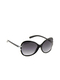

In [43]:
Image('images/16871.jpg')

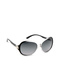

In [44]:
Image(filenames[indices[0][1]])

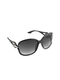

In [45]:
Image(filenames[indices[0][2]])

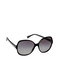

In [46]:
Image(filenames[indices[0][3]])

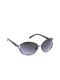

In [47]:
Image(filenames[indices[0][4]])

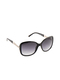

In [48]:
Image(filenames[indices[0][5]])

In [49]:
#Importing Libraries

In [50]:
import numpy as np
import pickle as pkl
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalMaxPool2D

from sklearn.neighbors import NearestNeighbors
import os
from numpy.linalg import norm

In [ ]:
#Extract Filenames from Folder

In [51]:
filenames = []
for file in os.listdir('images'):
    filenames.append(os.path.join('images',file))
    

In [52]:
len(filenames)

44441

In [ ]:
#Importing ResNet50 Model and Cofiguration

In [53]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalMaxPooling2D, Input
# Define the input shape
input_tensor = Input(shape=(224, 224, 3))

# Load the ResNet50 model without the top layers
base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze the base model
base_model.trainable = False

# Apply GlobalMaxPooling2D
x = base_model.output
x = GlobalMaxPooling2D()(x)

# Create the final model
model = tf.keras.models.Model(inputs=base_model.input, outputs=x)

# Print the model summary
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
#Extracting Fetaures from Image

In [54]:
img = image.load_img('images/16871.jpg', target_size=(224,224))
img_array = image.img_to_array(img)
img_expand_dim = np.expand_dims(img_array, axis=0)
img_preprocess = preprocess_input(img_expand_dim)
result = model.predict(img_preprocess).flatten()
norm_result = result/norm(result)
norm_result

c:\Users\isha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_176']. Received: the structure of inputs=*
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


array([0.        , 0.00295298, 0.        , ..., 0.00752507, 0.02113524,
       0.00401739], dtype=float32)

In [57]:
def extract_features_from_images(image_path, model):
    img = image.load_img(image_path, target_size=(224,224))
    img_array = image.img_to_array(img)
    img_expand_dim = np.expand_dims(img_array, axis=0)
    img_preprocess = preprocess_input(img_expand_dim)
    result = model.predict(img_preprocess).flatten()
    norm_result = result/norm(result)
    return norm_result

In [58]:
extract_features_from_images(filenames[0], model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


array([0.        , 0.01761619, 0.00171607, ..., 0.01247238, 0.027264  ,
       0.06899219], dtype=float32)

In [59]:
image_features1 = []
for file in filenames[0:5000]:
    image_features1.append(extract_features_from_images(file, model))
image_features1

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

[array([0.        , 0.01761619, 0.00171607, ..., 0.01247238, 0.027264  ,
        0.06899219], dtype=float32),
 array([0.        , 0.03648943, 0.        , ..., 0.00997913, 0.02375534,
        0.04649905], dtype=float32),
 array([0.        , 0.03642146, 0.00710437, ..., 0.00140771, 0.        ,
        0.05435037], dtype=float32),
 array([0.00232166, 0.0503055 , 0.00747742, ..., 0.00346686, 0.03391019,
        0.04565743], dtype=float32),
 array([0.00306835, 0.06240452, 0.        , ..., 0.00170624, 0.02032885,
        0.05833261], dtype=float32),
 array([0.        , 0.10469119, 0.00198091, ..., 0.        , 0.03033769,
        0.02712847], dtype=float32),
 array([0.        , 0.12438459, 0.01465611, ..., 0.00289707, 0.04055161,
        0.06534589], dtype=float32),
 array([0.        , 0.09169203, 0.01569911, ..., 0.        , 0.00503581,
        0.0456004 ], dtype=float32),
 array([0.        , 0.09545276, 0.01153319, ..., 0.00073009, 0.04513267,
        0.07661068], dtype=float32),
 array([0.

In [60]:
image_features2 = []
for file in filenames[5000:10000]:
    image_features2.append(extract_features_from_images(file, model))
image_features2

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━

[array([0.        , 0.00020797, 0.02824724, ..., 0.01861726, 0.01859031,
        0.        ], dtype=float32),
 array([0.00087395, 0.        , 0.0658939 , ..., 0.01608951, 0.04219769,
        0.00720919], dtype=float32),
 array([0.00149236, 0.        , 0.02726914, ..., 0.01417631, 0.01048496,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.0219036 , ..., 0.01149264, 0.03505957,
        0.00586666], dtype=float32),
 array([0.        , 0.00043467, 0.02380941, ..., 0.01432525, 0.00015516,
        0.        ], dtype=float32),
 array([0.00696223, 0.        , 0.03893173, ..., 0.01303011, 0.0183058 ,
        0.01507954], dtype=float32),
 array([0.        , 0.00068429, 0.01879014, ..., 0.01664155, 0.06425367,
        0.        ], dtype=float32),
 array([0.        , 0.00203129, 0.00876081, ..., 0.00481778, 0.02018857,
        0.        ], dtype=float32),
 array([0.00451243, 0.00134719, 0.0583957 , ..., 0.02344004, 0.04832557,
        0.        ], dtype=float32),
 array([0.

In [61]:
image_features3 = []
for file in filenames[10000:15000]:
    image_features3.append(extract_features_from_images(file, model))
image_features3

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━

[array([0.        , 0.02421599, 0.        , ..., 0.        , 0.04093151,
        0.00733136], dtype=float32),
 array([0.00515353, 0.01465176, 0.        , ..., 0.        , 0.04547488,
        0.02252127], dtype=float32),
 array([0.02109206, 0.00251121, 0.02283168, ..., 0.00136069, 0.03525599,
        0.01824661], dtype=float32),
 array([0.02387427, 0.00255825, 0.03093214, ..., 0.01132638, 0.03652758,
        0.        ], dtype=float32),
 array([0.02004949, 0.        , 0.02497419, ..., 0.00551558, 0.02308727,
        0.01520418], dtype=float32),
 array([0.02166417, 0.        , 0.02709857, ..., 0.0098591 , 0.02573998,
        0.        ], dtype=float32),
 array([0.0450213 , 0.01082987, 0.02759457, ..., 0.00510335, 0.0131701 ,
        0.01095512], dtype=float32),
 array([0.04150079, 0.02184161, 0.01850122, ..., 0.00881133, 0.02574007,
        0.0085933 ], dtype=float32),
 array([0.02639372, 0.01020908, 0.02779201, ..., 0.00161442, 0.03998297,
        0.01908896], dtype=float32),
 array([0.

In [62]:
image_features4 = []
for file in filenames[15000:20000]:
    image_features4.append(extract_features_from_images(file, model))
image_features4

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━

[array([0.00863168, 0.02865056, 0.00231382, ..., 0.00332751, 0.02116211,
        0.00700104], dtype=float32),
 array([0.00835171, 0.02356163, 0.00382075, ..., 0.00273881, 0.01531786,
        0.04594712], dtype=float32),
 array([7.7285068e-03, 2.8887583e-02, 9.7036616e-05, ..., 9.2884554e-03,
        6.0634702e-03, 4.6985101e-02], dtype=float32),
 array([0.00865364, 0.04195024, 0.00919022, ..., 0.0336986 , 0.0198507 ,
        0.07571039], dtype=float32),
 array([0.00436906, 0.04892077, 0.01762689, ..., 0.00921408, 0.0373979 ,
        0.07440332], dtype=float32),
 array([0.01333813, 0.02120707, 0.01992648, ..., 0.00907888, 0.02278705,
        0.05961237], dtype=float32),
 array([0.00801954, 0.02379157, 0.00650234, ..., 0.01104788, 0.02808941,
        0.08728445], dtype=float32),
 array([0.00492639, 0.06831919, 0.        , ..., 0.00816643, 0.01666156,
        0.09462845], dtype=float32),
 array([0.01084145, 0.04352029, 0.0042281 , ..., 0.01892141, 0.03217785,
        0.10350233], dtype=fl

In [63]:
image_features5 = []
for file in filenames[20000:25000]:
    image_features5.append(extract_features_from_images(file, model))
image_features5

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━

[array([0.        , 0.03271804, 0.00630449, ..., 0.        , 0.00972789,
        0.        ], dtype=float32),
 array([0.        , 0.01557678, 0.00195161, ..., 0.00206505, 0.00834134,
        0.00125586], dtype=float32),
 array([0.0075465 , 0.05209839, 0.00581414, ..., 0.01000258, 0.00753492,
        0.03117252], dtype=float32),
 array([0.02921468, 0.00340571, 0.0079393 , ..., 0.00385808, 0.04172435,
        0.        ], dtype=float32),
 array([0.        , 0.02083117, 0.        , ..., 0.        , 0.03230345,
        0.06237337], dtype=float32),
 array([0.00605005, 0.0275933 , 0.        , ..., 0.        , 0.01716537,
        0.04255498], dtype=float32),
 array([0.0261245 , 0.00555303, 0.00941141, ..., 0.03014757, 0.01825813,
        0.        ], dtype=float32),
 array([0.00764448, 0.        , 0.05223782, ..., 0.01094852, 0.02032682,
        0.01191601], dtype=float32),
 array([0.        , 0.        , 0.02691041, ..., 0.00444015, 0.01349137,
        0.        ], dtype=float32),
 array([0.

In [64]:
image_features6 = []
for file in filenames[25000:30000]:
    image_features6.append(extract_features_from_images(file, model))
image_features6

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━

[array([0.00187643, 0.00367609, 0.00183884, ..., 0.02103244, 0.00162561,
        0.        ], dtype=float32),
 array([0.        , 0.0011662 , 0.02147515, ..., 0.03416643, 0.02493841,
        0.04047467], dtype=float32),
 array([0.00119949, 0.        , 0.00378183, ..., 0.00797906, 0.01734516,
        0.02841494], dtype=float32),
 array([0.        , 0.00333786, 0.02192624, ..., 0.04130785, 0.00360378,
        0.02250373], dtype=float32),
 array([0.        , 0.        , 0.01207576, ..., 0.02598566, 0.00910361,
        0.02909449], dtype=float32),
 array([0.        , 0.00348995, 0.01682091, ..., 0.01619751, 0.        ,
        0.01162417], dtype=float32),
 array([0.00344168, 0.00459569, 0.03726139, ..., 0.01524768, 0.00765826,
        0.03256883], dtype=float32),
 array([0.        , 0.        , 0.04862171, ..., 0.00731732, 0.00595151,
        0.04255175], dtype=float32),
 array([0.        , 0.00359344, 0.04293947, ..., 0.01887305, 0.0052921 ,
        0.00989665], dtype=float32),
 array([0.

In [65]:
image_features7 = []
for file in filenames[30000:35000]:
    image_features7.append(extract_features_from_images(file, model))
image_features7

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

[array([0.        , 0.01353551, 0.        , ..., 0.00454813, 0.03602887,
        0.00341316], dtype=float32),
 array([0.00056641, 0.03315606, 0.        , ..., 0.        , 0.01349832,
        0.00109097], dtype=float32),
 array([0.        , 0.        , 0.01553157, ..., 0.00259363, 0.00851632,
        0.02660497], dtype=float32),
 array([0.        , 0.01098023, 0.00268055, ..., 0.00296261, 0.04468144,
        0.05921422], dtype=float32),
 array([0.00224461, 0.        , 0.00870528, ..., 0.01343979, 0.        ,
        0.03059375], dtype=float32),
 array([0.00848437, 0.00830942, 0.03348009, ..., 0.        , 0.00457752,
        0.04082964], dtype=float32),
 array([0.0000000e+00, 1.2101526e-05, 9.8863672e-03, ..., 2.0874197e-02,
        3.3183809e-02, 4.0397380e-02], dtype=float32),
 array([0.00022729, 0.01114656, 0.01016103, ..., 0.        , 0.02015215,
        0.06584553], dtype=float32),
 array([0.        , 0.00414823, 0.02058961, ..., 0.00916086, 0.00388337,
        0.0299526 ], dtype=fl

In [66]:
image_features8 = []
for file in filenames[35000:40000]:
    image_features8.append(extract_features_from_images(file, model))
image_features8

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

[array([0.00411963, 0.02725231, 0.01155952, ..., 0.00015792, 0.03573706,
        0.03821421], dtype=float32),
 array([0.00056734, 0.03355643, 0.        , ..., 0.03315266, 0.05084901,
        0.        ], dtype=float32),
 array([0.        , 0.00271915, 0.00561353, ..., 0.00849214, 0.00097124,
        0.00375552], dtype=float32),
 array([0.0033746 , 0.006165  , 0.01895861, ..., 0.00616081, 0.        ,
        0.00599654], dtype=float32),
 array([0.0008837 , 0.01656226, 0.01490181, ..., 0.00716276, 0.01676469,
        0.01155646], dtype=float32),
 array([0.        , 0.02104739, 0.00994502, ..., 0.00229833, 0.01308319,
        0.00256955], dtype=float32),
 array([0.        , 0.00940537, 0.00560629, ..., 0.01307699, 0.03165875,
        0.02810584], dtype=float32),
 array([0.        , 0.03499897, 0.00913313, ..., 0.02662986, 0.07354462,
        0.0381447 ], dtype=float32),
 array([0.00095222, 0.01979924, 0.00191983, ..., 0.        , 0.013448  ,
        0.02929224], dtype=float32),
 array([0.

In [67]:
image_features9 = []
for file in filenames[40000:45000]:
    image_features9.append(extract_features_from_images(file, model))
image_features9

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━

[array([0.        , 0.        , 0.        , ..., 0.        , 0.00340955,
        0.        ], dtype=float32),
 array([0.        , 0.00863073, 0.        , ..., 0.00432074, 0.01916734,
        0.04606046], dtype=float32),
 array([0.        , 0.0031777 , 0.        , ..., 0.00742356, 0.01773582,
        0.        ], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.01966102, 0.04162501,
        0.        ], dtype=float32),
 array([0.        , 0.06752903, 0.01026201, ..., 0.        , 0.01336517,
        0.02187251], dtype=float32),
 array([0.        , 0.00540193, 0.        , ..., 0.03120624, 0.02379706,
        0.        ], dtype=float32),
 array([0.01161376, 0.01208599, 0.        , ..., 0.00689741, 0.        ,
        0.        ], dtype=float32),
 array([2.9022736e-04, 4.1257665e-03, 0.0000000e+00, ..., 7.5151918e-05,
        2.6388586e-02, 0.0000000e+00], dtype=float32),
 array([0.00016525, 0.00529865, 0.        , ..., 0.        , 0.00906107,
        0.        ], dtype=fl

In [68]:
image_features = image_features1 +image_features2+image_features3+image_features4+image_features5+image_features6+image_features7+image_features8+image_features9

In [69]:
Image_features = pkl.dump(image_features, open('Images_features.pkl','wb'))
print(filenames)

['images\\10000.jpg', 'images\\10001.jpg', 'images\\10002.jpg', 'images\\10003.jpg', 'images\\10004.jpg', 'images\\10005.jpg', 'images\\10006.jpg', 'images\\10007.jpg', 'images\\10008.jpg', 'images\\10009.jpg', 'images\\10010.jpg', 'images\\10011.jpg', 'images\\10012.jpg', 'images\\10013.jpg', 'images\\10014.jpg', 'images\\10015.jpg', 'images\\10016.jpg', 'images\\10017.jpg', 'images\\10018.jpg', 'images\\10019.jpg', 'images\\10020.jpg', 'images\\10021.jpg', 'images\\10022.jpg', 'images\\10023.jpg', 'images\\10024.jpg', 'images\\10025.jpg', 'images\\10026.jpg', 'images\\10027.jpg', 'images\\10028.jpg', 'images\\10029.jpg', 'images\\10030.jpg', 'images\\10031.jpg', 'images\\10032.jpg', 'images\\10033.jpg', 'images\\10034.jpg', 'images\\10035.jpg', 'images\\10037.jpg', 'images\\10039.jpg', 'images\\10040.jpg', 'images\\10041.jpg', 'images\\10042.jpg', 'images\\10043.jpg', 'images\\10044.jpg', 'images\\10045.jpg', 'images\\10046.jpg', 'images\\10047.jpg', 'images\\10048.jpg', 'images\\100

In [70]:
file_dump = pkl.dump(filenames, open('filenames.pkl','wb'))

In [71]:
#Loading Pickle Files

In [72]:
Image_features = pkl.load(open('Images_features.pkl','rb'))

In [73]:
filenames = pkl.load(open('filenames.pkl','rb'))
try:
    filenames = pkl.load(open('filenames.pkl','rb'))
except Exception as e:
    print(e)

In [74]:
np.array(Image_features).shape

(44441, 2048)

In [ ]:
#Finidng Simialar Images

In [75]:
neighbors = NearestNeighbors(n_neighbors=6, algorithm='brute', metric='euclidean')

In [76]:
neighbors.fit(Image_features)

NearestNeighbors(algorithm='brute', metric='euclidean', n_neighbors=6)

In [78]:
input_image = extract_features_from_images('images/16871.jpg',model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


In [79]:
distance,indices = neighbors.kneighbors([input_image])

In [80]:
indices[0]

array([ 5828,  5799, 34267, 16489,  6257,  5814])

In [81]:
from IPython.display import Image

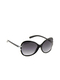

In [83]:
Image('images/16871.jpg')

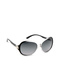

In [84]:
Image(filenames[indices[0][1]])

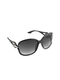

In [85]:
Image(filenames[indices[0][2]])

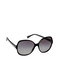

In [86]:
Image(filenames[indices[0][3]])

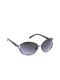

In [87]:
Image(filenames[indices[0][4]])

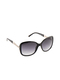

In [88]:
Image(filenames[indices[0][5]])